<a href="https://colab.research.google.com/github/Ykhaled2030/Enabled-Expiry-Date-Recognition-and-Object-Classification-of-Grocery-Products/blob/main/Deep%20learning%3A%20Enabled-Expiry-Date-Recognition-and-Object-Classification-of-Grocery-Products.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import subprocess

subprocess.run(['unzip', '/content/drive/MyDrive/dataset/Components-Real.zip', '-d', '/content/drive/MyDrive/dataset/Components-Real'])
subprocess.run(['unzip', '/content/drive/MyDrive/dataset/Date-Real.zip', '-d', '/content/drive/MyDrive/dataset/Date-Real'])
subprocess.run(['unzip', '/content/drive/MyDrive/dataset/Products-Real.zip', '-d', '/content/drive/MyDrive/dataset/Products-Real'])
subprocess.run(['unzip', '/content/drive/MyDrive/Project/Components-Synth.zip', '-d', '/content/drive/MyDrive/Project/Components-Synth.zip'])
subprocess.run(['unzip', '/content/drive/MyDrive/Project/Date-Synth.zip', '-d', '/content/drive/MyDrive/Project/Date-Synth.zip'])
subprocess.run(['unzip', '/content/drive/MyDrive/Project/Products-Synth.zip', '-d', '/content/drive/MyDrive/Project/Products-Synth.zip'])


CompletedProcess(args=['unzip', '/content/drive/MyDrive/Project/Products-Synth.zip', '-d', '/content/drive/MyDrive/Project/Products-Synth.zip'], returncode=2)

# Data Augmentation

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os, os.path
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import imread,imshow, subplots, show
from PIL import Image

In [ ]:
def plot(data_generator):

    """
    plots 4 images generated by the ImageDataGenerator
    """
    data_generator.fit(images)
    image_iterator = data_generator.flow(images)

    # Plot the images in iteration
    fig, rows = subplots(nrows=1, ncols=4, figsize=(18,18))
    for row in rows:
        row.imshow(image_iterator.next()[0])#.astype('int')
        row.axis('off')
    show()

In [ ]:
folder = "/content/drive/MyDrive/Project/Products-Real"
folder_list = os.listdir(folder)


In [ ]:
import os
import json
from imageio import imread

# Assuming you have a path to your annotations and images
annotations_path = '/content/drive/MyDrive/Project/Products-Real/annotations.json'
images_directory = '/content/drive/MyDrive/Project/Products-Real/train/images/'

# Read the annotations file
if os.path.isfile(annotations_path):
    with open(annotations_path, 'r') as f:
        annotations = json.load(f)
        print(annotations)  # Print the annotations to see its structure
else:
    print("Annotations file not found.")

# Make sure annotations is a list
if isinstance(annotations, list):
    # Process images based on annotations
    for annotation in annotations:
        # Adjust this according to the actual structure of your JSON
        image_filename = annotation['filename']  # Or the appropriate key
        full_path = os.path.join(images_directory, image_filename)

        # Check if the path is a file before trying to read it
        if os.path.isfile(full_path):
            image = imread(full_path)
            images = image.reshape(1, image.shape[0], image.shape[1], image.shape[2])
            image = images[0]
        else:
            print(f"Image {full_path} not found.")
else:
    print("Annotations data is not a list.")


{'test_00018.jpg': {'ann': [{'cls': 'product', 'bbox': [0.2, 0.3, 0.6, 0.8]}]}, 'test_00019.jpg': {'ann': [{'cls': 'product', 'bbox': [0.1, 0.4, 0.5, 0.7]}]}}
Annotations data is not a list.


In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.io import imread

# Specify the folder and valid image extensions
folder = '/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation'
valid_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tiff")

for path in os.listdir(folder):
    full_path = os.path.join(folder, path)

    # Check if it is a file and has a valid image extension
    if os.path.isfile(full_path) and full_path.lower().endswith(valid_extensions):
        image = imread(full_path)
        images = image.reshape(1, image.shape[0], image.shape[1], image.shape[2])
        image = images[0]

        # FLIP LEFT RIGHT
        flip_left_right = tf.image.flip_left_right(image)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_Flip_LR.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(flip_left_right, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # FLIP UP DOWN
        flip_up_down = tf.image.flip_up_down(image)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_Flip_UP.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(flip_up_down, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # ROTATE 90
        rot90 = tf.image.rot90(image, k=1)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_ROT90.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(rot90, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # ROTATE 270
        rot270 = tf.image.rot90(image, k=3)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_ROT270.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(rot270, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # ADJUST SATURATION
        saturated = tf.image.adjust_saturation(image, 0.5)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_SATURATE.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(saturated, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # ADJUST BRIGHTNESS
        bright = tf.image.adjust_brightness(image, 0.2)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_BRIGHT.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(bright, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()

        # ADJUST GAMMA
        gamma = tf.image.adjust_gamma(image, gamma=3, gain=2)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        save_path = full_path[:-4] + "_GAMMA.png"
        fig.set_size_inches(10.5, 10.5)
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(gamma, aspect='auto')
        fig.savefig(save_path, dpi='figure', format='png')
        plt.close()



# OCR

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (3,214 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
!pip install pytesseract


In [ ]:
!pip install easyocr


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 912.2/912.2 kB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.8/286.8 kB 15.6 MB/s eta 0:00:00


In [ ]:


# Install pytesseract
!pip install pytesseract

# Import libraries
import pytesseract
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.io import imread

# If you're using it locally, set the path to the Tesseract executable
# pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'  # Adjust this if needed

# Your image processing code here...


In [ ]:


pytesseract.pytesseract.tesseract_cmd =(r'/usr/local/bin/pytesseract')
pytesseract.pytesseract.tesseract_cmd = ( r'/usr/bin/tesseract' )

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteProcessing rotated_180_mirrored_img_00067_ROT270.png...


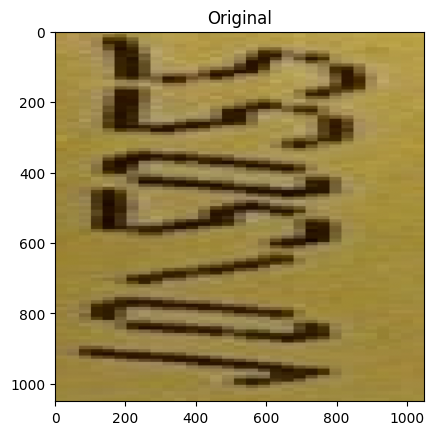

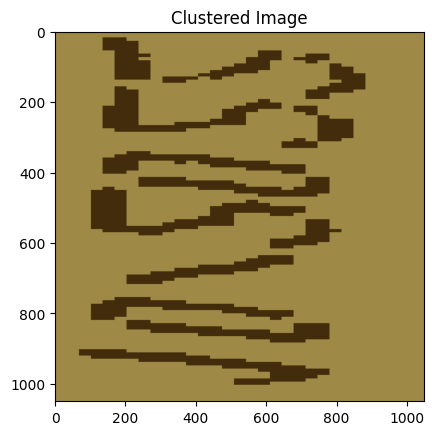

Extracted Text with pytesseract:
i_—"
a =.
a
or,
LT el
_——_ =
ee



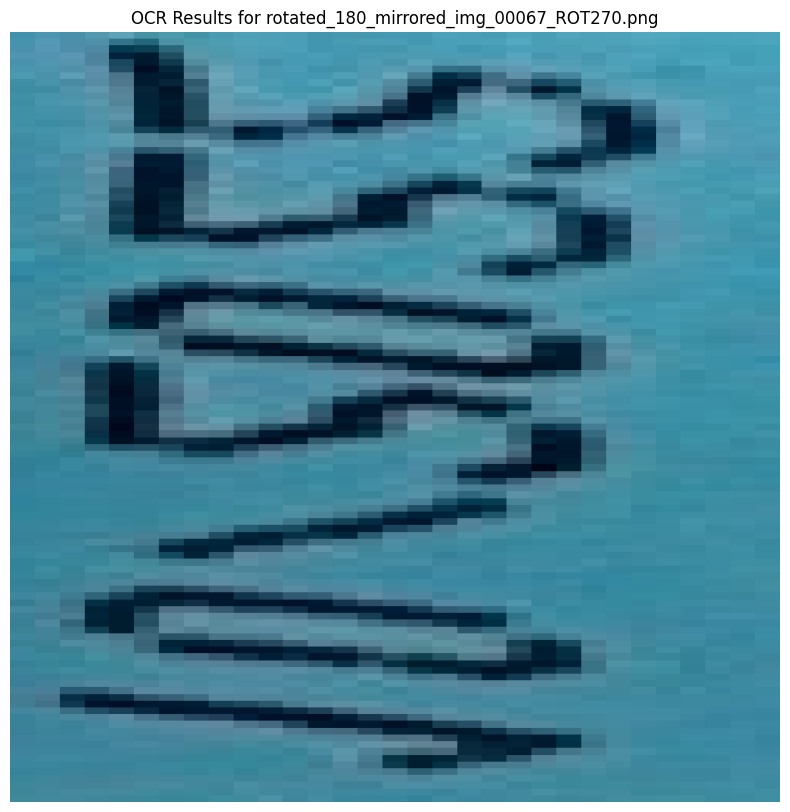

Processing rotated_270_mirrored_img_00067_ROT270.png...


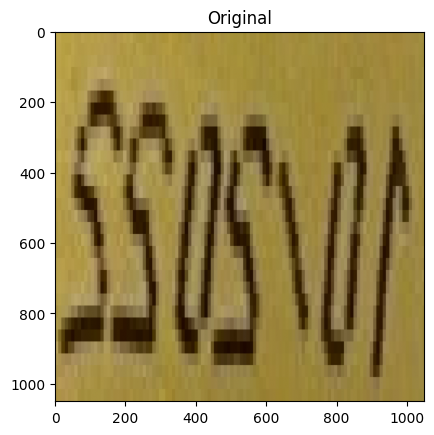

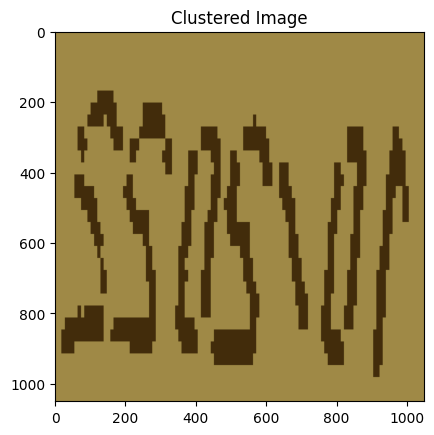

Extracted Text with pytesseract:
NY



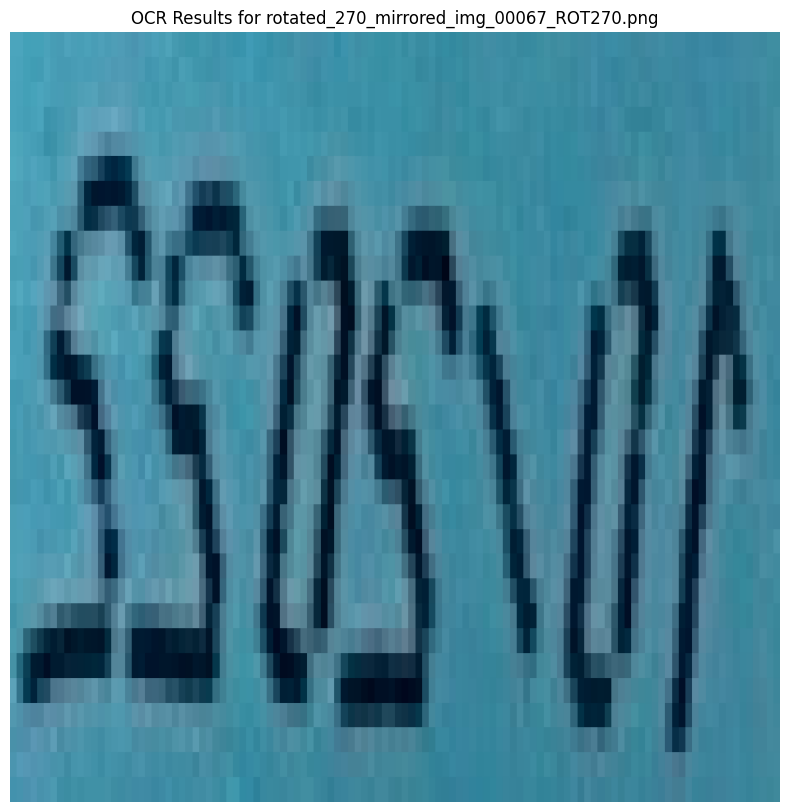

Processing cropped_mirrored_img_00067_ROT270.png...


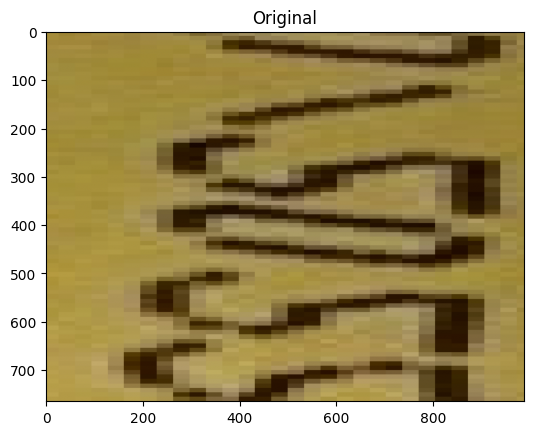

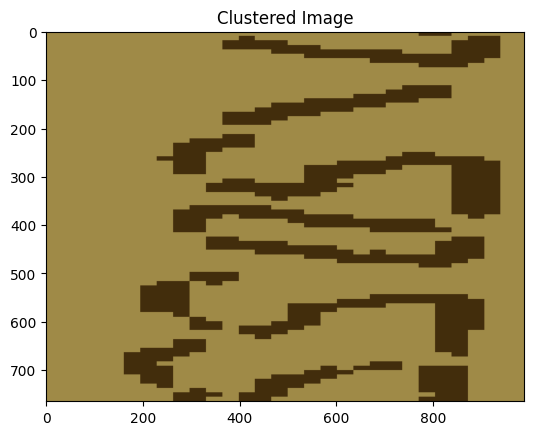

Extracted Text with pytesseract:
> _
-
a
ee
a__=— >}
.—



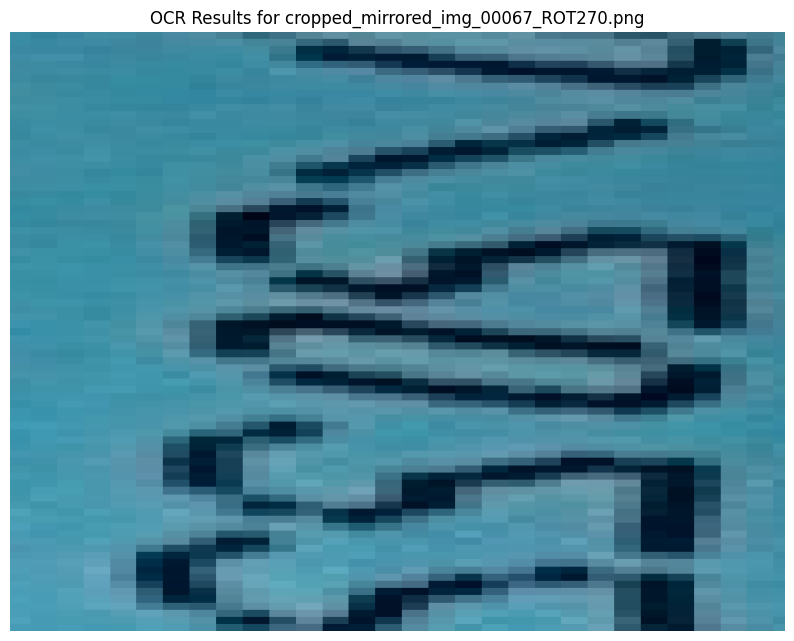

Processing mirrored_mirrored_img_00067_ROT270.png...


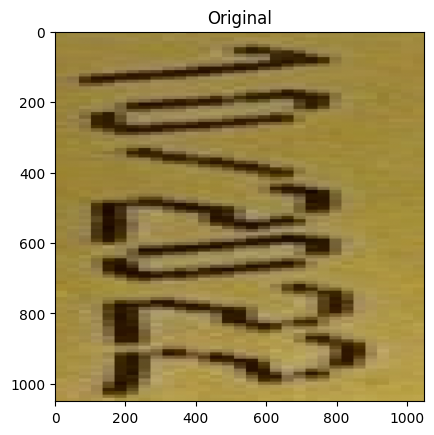

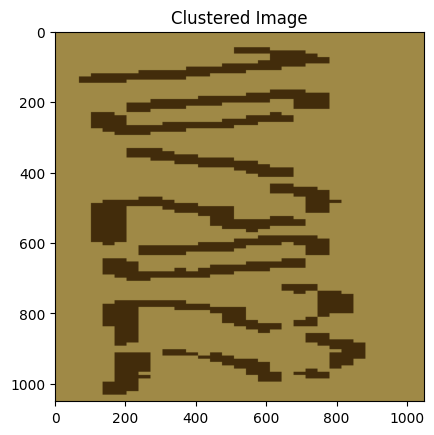

Extracted Text with pytesseract:
a
le
—
a"
————"
=
fo



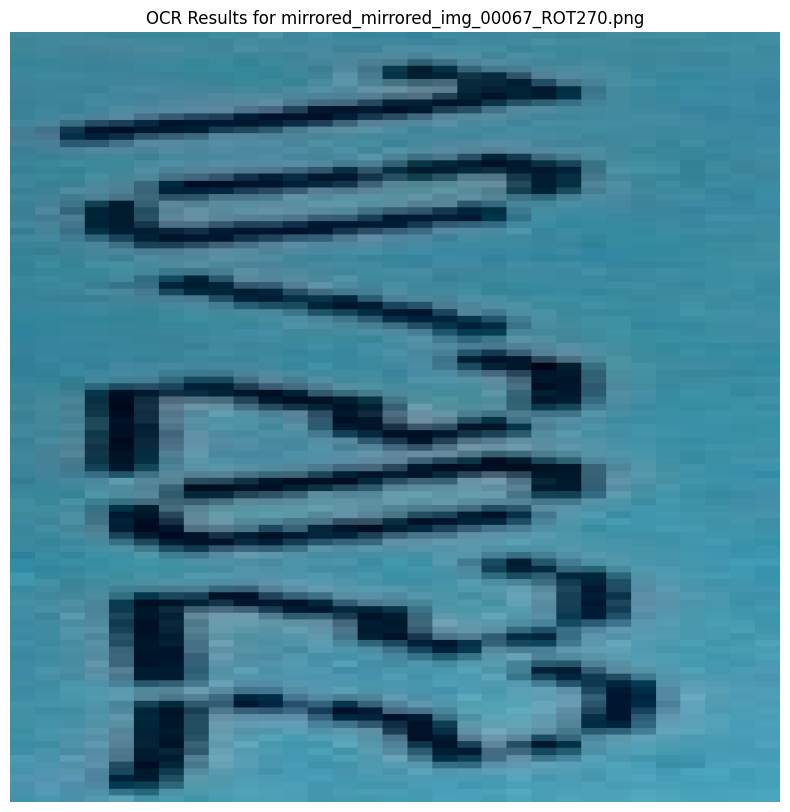

Processing rotated_0_rotated_90_img_00067_ROT270.png...


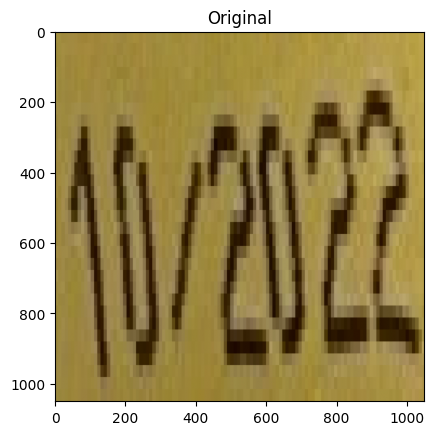

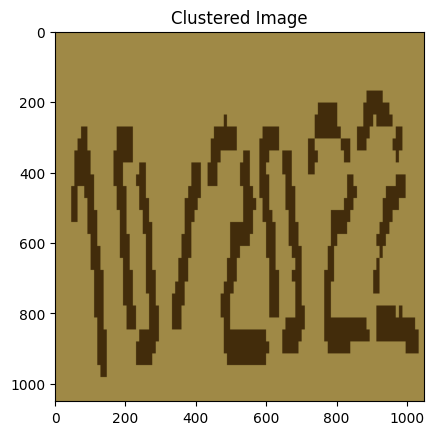

Extracted Text with pytesseract:
he



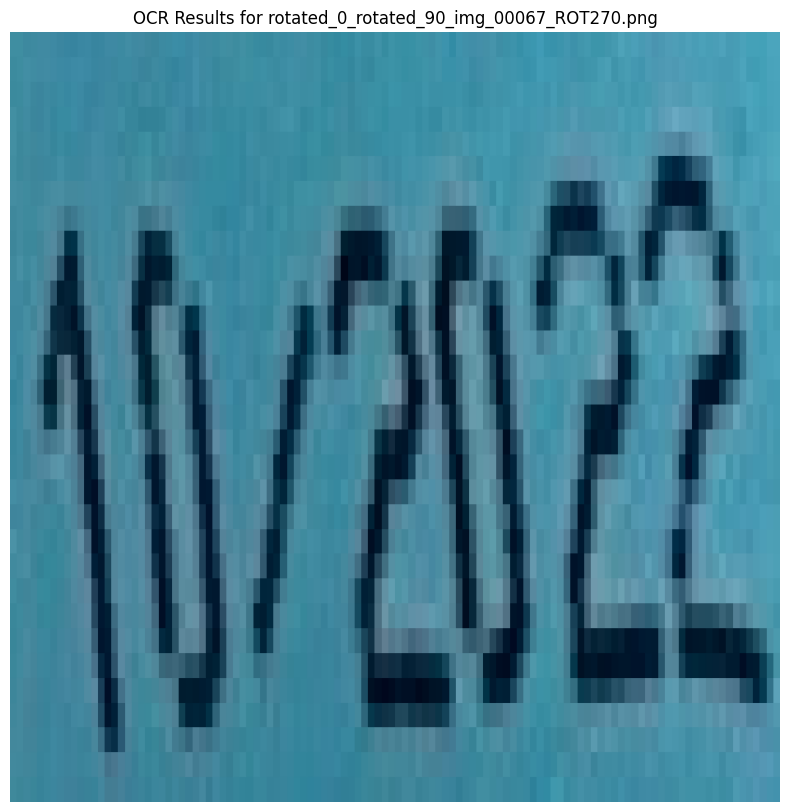

Processing rotated_90_rotated_90_img_00067_ROT270.png...


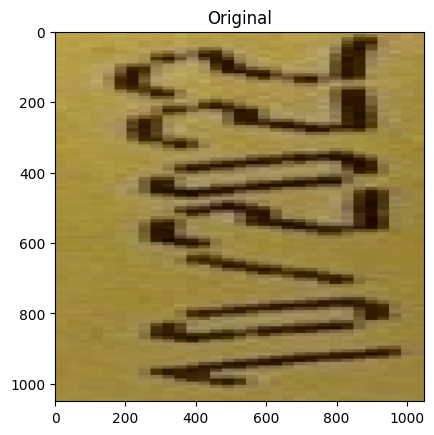

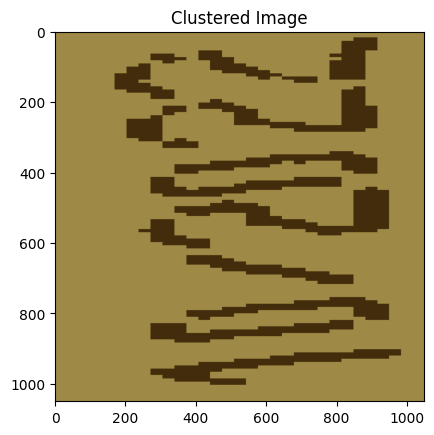

Extracted Text with pytesseract:
a_i
a = ——h
———
a =
ae
a
Ee



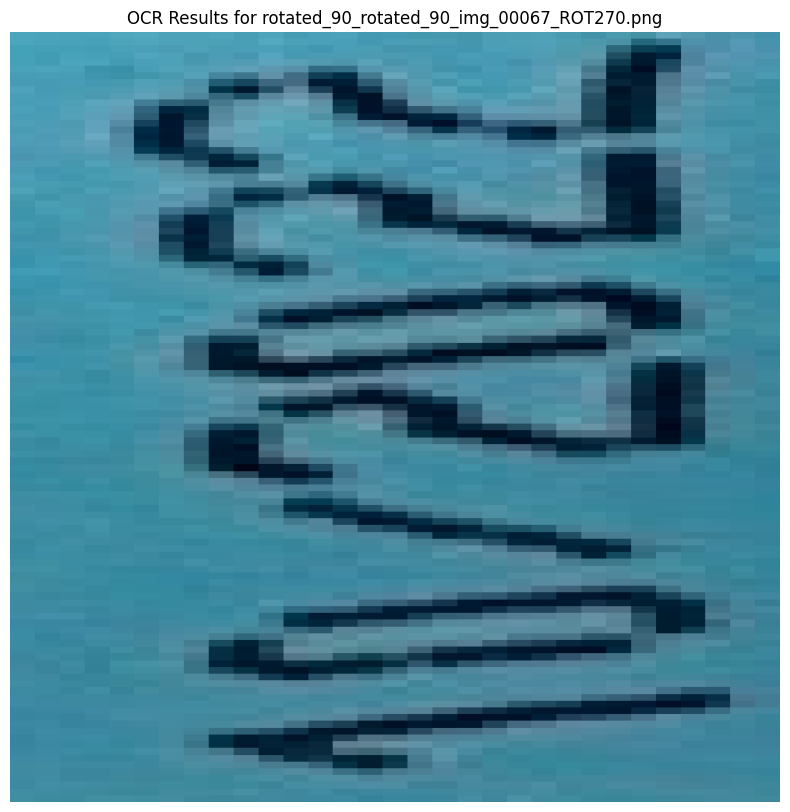

Processing rotated_180_rotated_90_img_00067_ROT270.png...


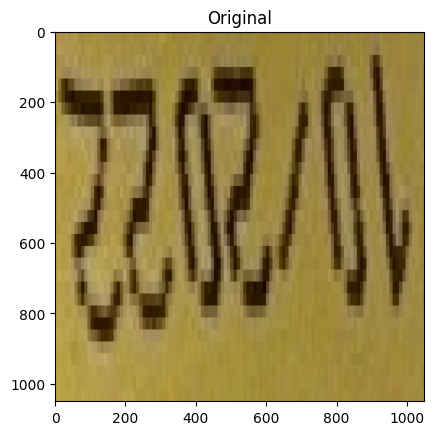

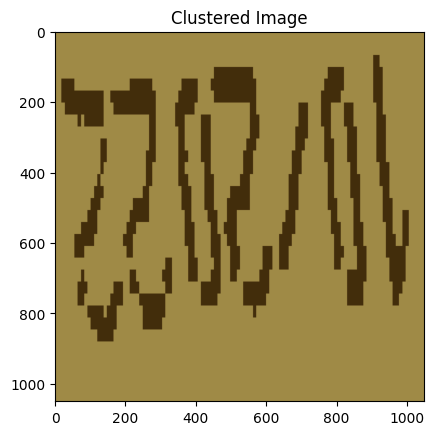

Extracted Text with pytesseract:
HH



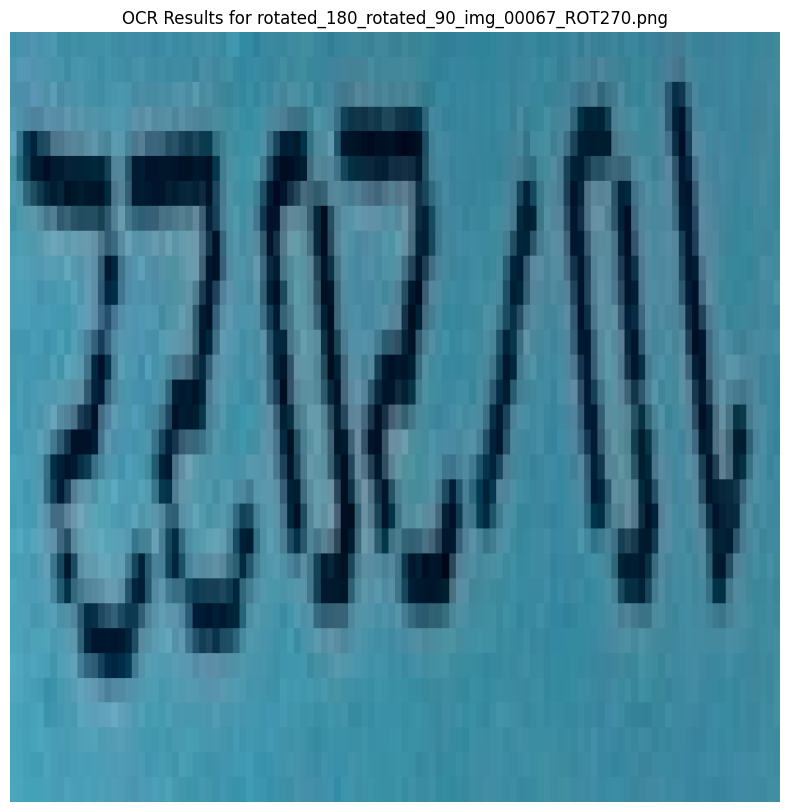

Processing rotated_270_rotated_90_img_00067_ROT270.png...


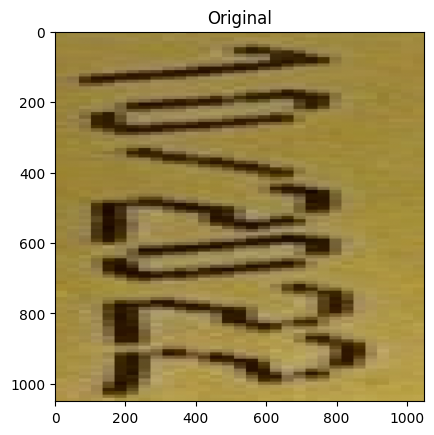

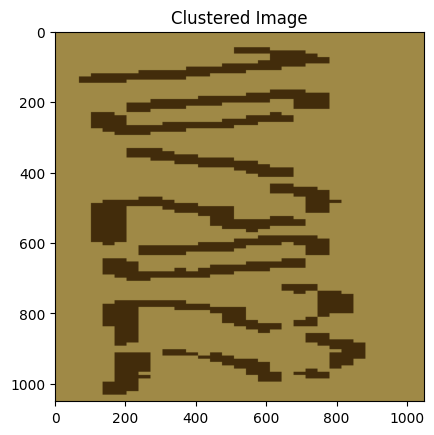

Extracted Text with pytesseract:
a
le
—
a"
————"
=
fo



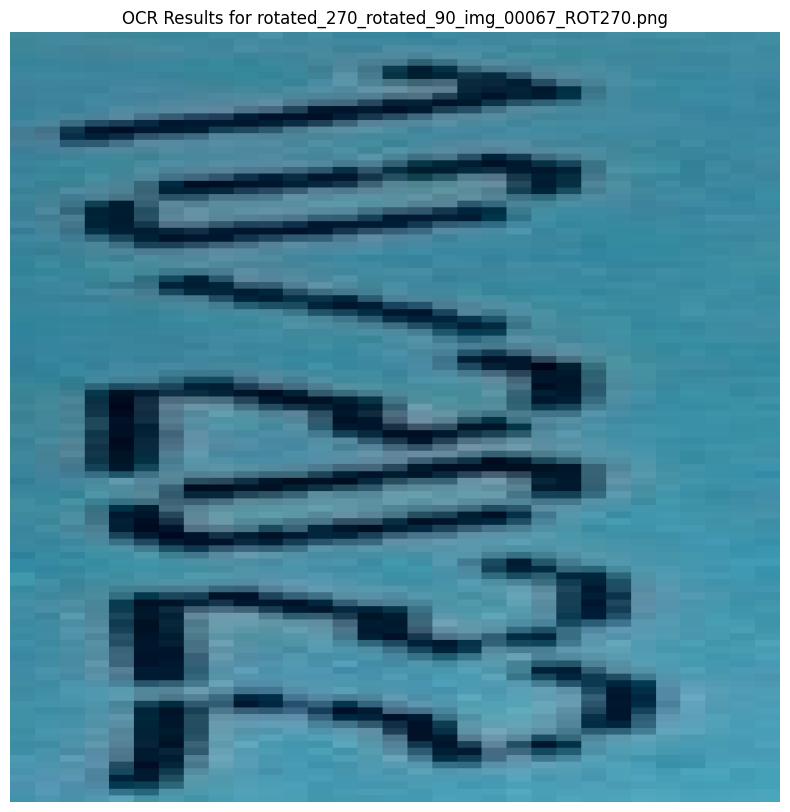

Processing cropped_rotated_90_img_00067_ROT270.png...


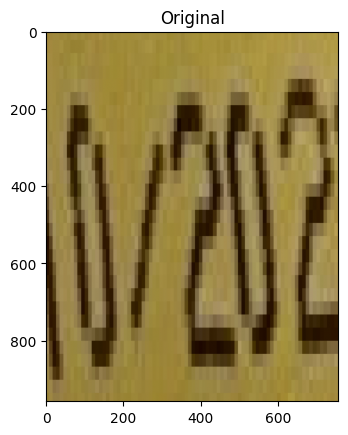

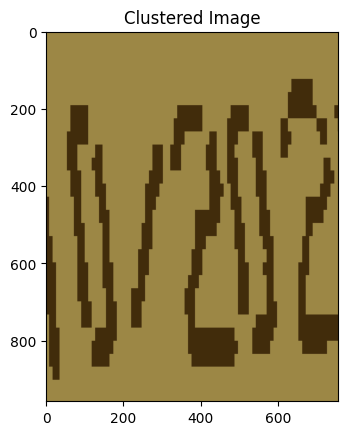

Extracted Text with pytesseract:
Mi



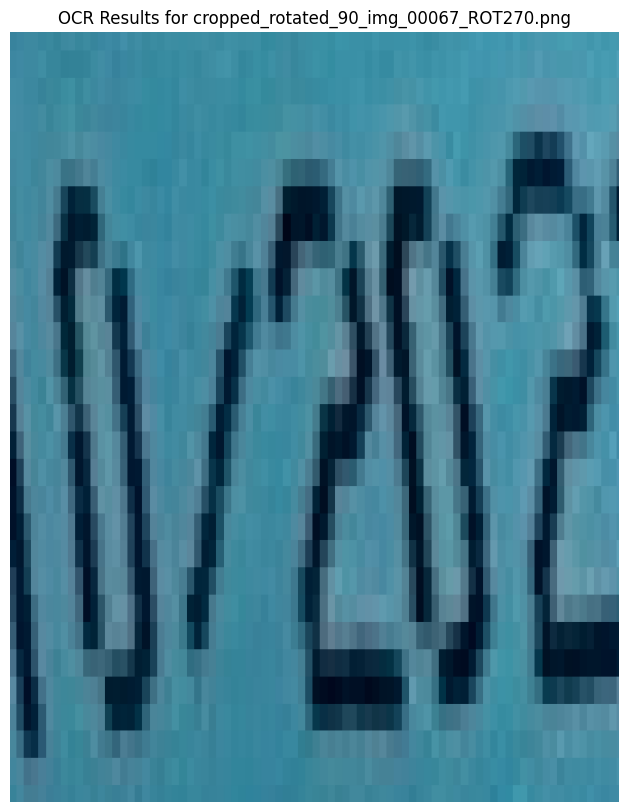

Processing mirrored_rotated_90_img_00067_ROT270.png...


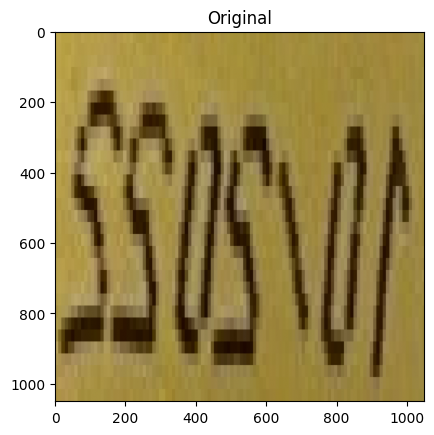

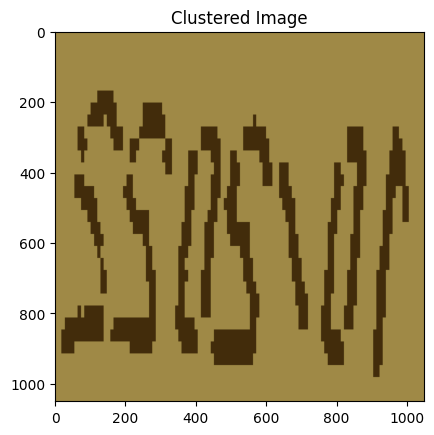

Extracted Text with pytesseract:
NY



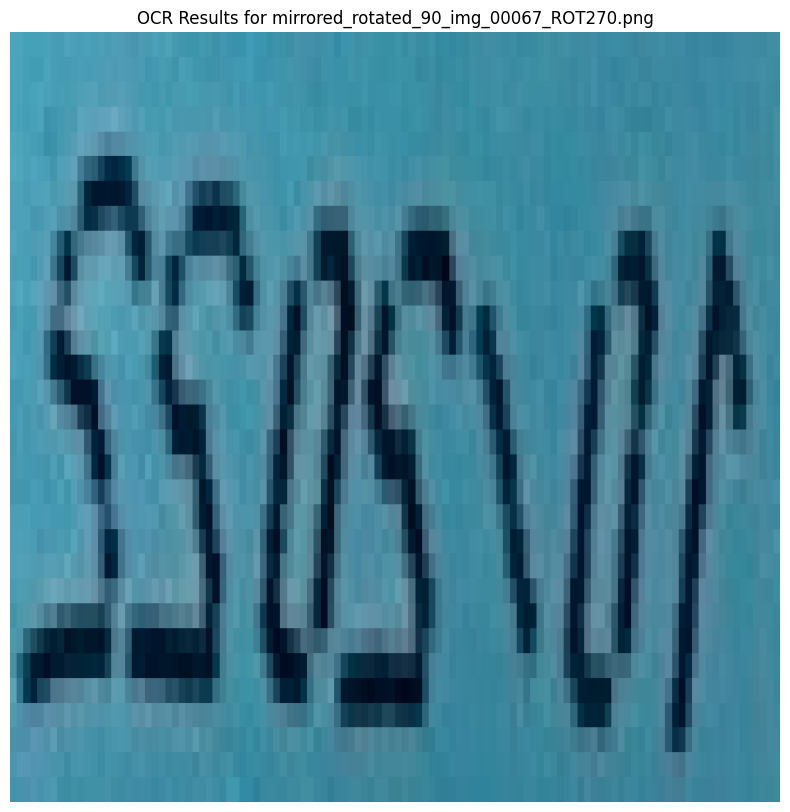

In [ ]:
import cv2
import easyocr
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from sklearn.cluster import KMeans
import pytesseract
from PIL import Image

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])  # Specify the language

# Function to perform OCR on the image
def perform_ocr(image):
    # Convert the image to RGB (EasyOCR uses RGB format)
    image_rgb = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_BGR2RGB)  # Convert back to 8-bit

    # Perform OCR
    results = reader.readtext(image_rgb)

    # Draw bounding boxes and text on the image
    for (bbox, text, prob) in results:
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple(map(int, top_left))
        bottom_right = tuple(map(int, bottom_right))

        # Draw the bounding box
        cv2.rectangle(image_rgb, top_left, bottom_right, (0, 255, 0), 2)

        # Display the text
        cv2.putText(image_rgb, text, (top_left[0], top_left[1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return image_rgb, results

# Function for K-means clustering and OCR
def process_image(image_path):
    # Read and scale the image
    img = imread(image_path) / 255.0
    plt.imshow(img)
    plt.title('Original')
    plt.show()

    # For clustering the image using k-means
    image_2D = img.reshape(img.shape[0] * img.shape[1], img.shape[2])
    kmeans = KMeans(n_clusters=2, random_state=0).fit(image_2D)
    clustered = kmeans.cluster_centers_[kmeans.labels_]
    clustered_3D = clustered.reshape(img.shape[0], img.shape[1], img.shape[2])

    plt.imshow(clustered_3D)
    plt.title('Clustered Image')
    plt.show()

    # Convert to uint8 for pytesseract
    clustered_image = (clustered_3D * 255).astype(np.uint8)

    # OCR with pytesseract
    custom_config = r'--oem 3 --psm 6'
    extracted_text = pytesseract.image_to_string(clustered_image, config=custom_config)
    print("Extracted Text with pytesseract:")
    print(extracted_text)

    # Perform OCR with EasyOCR
    output_image, ocr_results = perform_ocr(img)

    # Display the results
    plt.figure(figsize=(10, 10))
    plt.imshow(output_image)
    plt.axis('off')
    plt.title('OCR Results for ' + os.path.basename(image_path))
    plt.show()

    return ocr_results

# Process the images
date_real_path = '/content/drive/MyDrive/Project/Date-Real/Date-Real/images'
processed_count = 0  # Counter to keep track of processed images

for filename in os.listdir(date_real_path):
    if filename.lower().endswith(('.jpg', '.png')):
        image_path = os.path.join(date_real_path, filename)
        print(f'Processing {filename}...')
        ocr_results = process_image(image_path)

        processed_count += 1
        if processed_count >= 10:
            break  # Stop after processing two images


# PCA

In [ ]:
import cv2

file = '/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00008.jpg'
img = cv2.imread(file)
print(img.shape)

(761, 1014, 3)


In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import cv2
from scipy.stats import stats
import matplotlib.image as mpimg

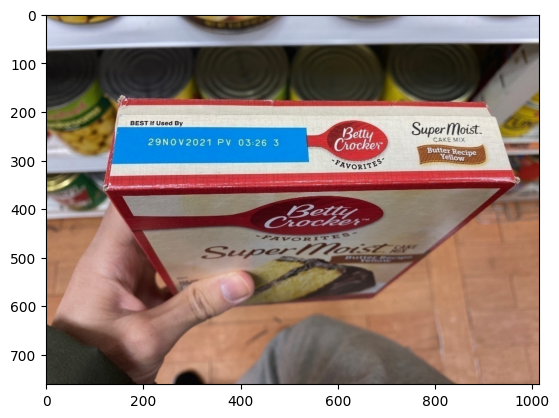

In [ ]:

img = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00008.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

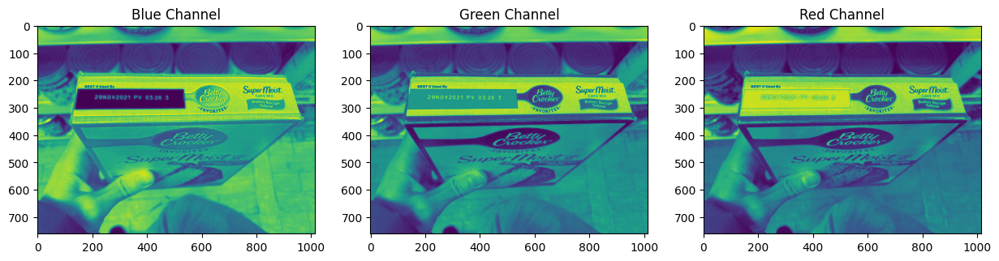

In [ ]:

#Splitting into channels
blue,green,red = cv2.split(img)
# Plotting the images
fig = plt.figure(figsize = (15, 7.2))
fig.add_subplot(131)
plt.title("Blue Channel")
plt.imshow(blue)
fig.add_subplot(132)
plt.title("Green Channel")
plt.imshow(green)
fig.add_subplot(133)
plt.title("Red Channel")
plt.imshow(red)
plt.show()

In [ ]:

blue_temp_df = pd.DataFrame(data = blue)
display(blue_temp_df)

,0,1,2,3,4,5,6,7,8,9,...,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013
0,175,174,177,185,187,186,183,185,179,177,...,179,180,181,183,183,186,188,190,191,193
1,168,174,178,180,179,187,187,187,184,181,...,180,180,182,185,192,195,196,197,198,199
2,165,168,169,173,173,178,180,182,186,183,...,184,185,189,193,196,197,198,199,199,200
3,157,155,156,163,170,174,176,179,182,183,...,187,188,191,193,195,196,198,197,199,199
4,155,155,154,154,161,167,172,171,173,175,...,189,190,191,193,195,196,198,197,199,199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
756,63,49,62,54,59,56,68,63,52,55,...,174,175,176,176,174,174,175,175,175,176
757,59,52,70,65,65,58,65,55,58,58,...,175,176,177,178,175,176,176,176,176,176
758,67,57,66,56,57,54,65,55,60,51,...,175,175,177,177,178,179,180,180,180,179
759,58,50,62,55,61,55,62,47,59,42,...,177,177,178,178,178,180,182,183,183,183


In [ ]:

df_blue = blue/255
df_green = green/255
df_red = red/255

In [ ]:

pca_b = PCA(n_components=50)
pca_b.fit(df_blue)
trans_pca_b = pca_b.transform(df_blue)
pca_g = PCA(n_components=50)
pca_g.fit(df_green)
trans_pca_g = pca_g.transform(df_green)
pca_r = PCA(n_components=50)
pca_r.fit(df_red)
trans_pca_r = pca_r.transform(df_red)

In [ ]:

print(f"Blue Channel : {sum(pca_b.explained_variance_ratio_)}")
print(f"Green Channel: {sum(pca_g.explained_variance_ratio_)}")
print(f"Red Channel  : {sum(pca_r.explained_variance_ratio_)}")

Blue Channel : 0.9808479399679974
Green Channel: 0.9757044655786826
Red Channel  : 0.9811836726998345


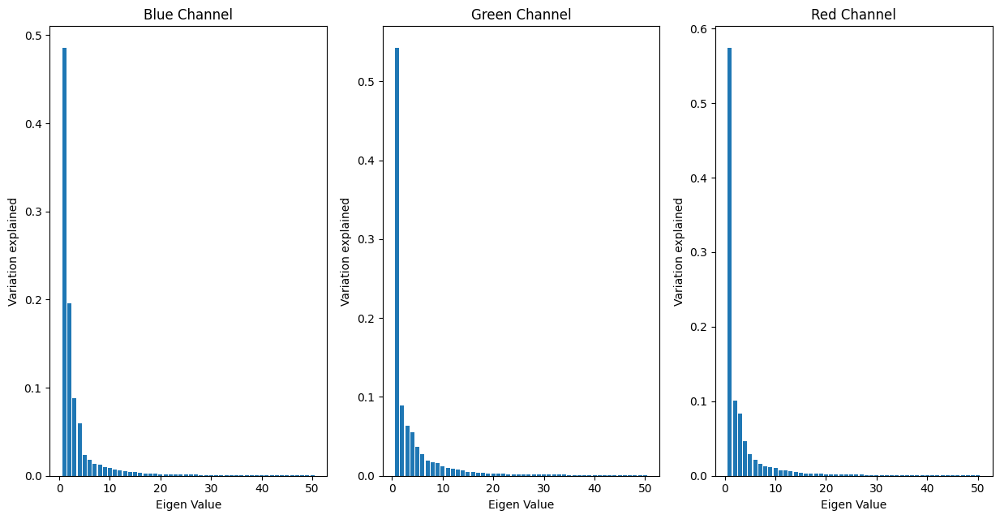

In [ ]:

fig = plt.figure(figsize = (15, 7.2))
fig.add_subplot(131)
plt.title("Blue Channel")
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.bar(list(range(1,51)),pca_b.explained_variance_ratio_)
fig.add_subplot(132)
plt.title("Green Channel")
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.bar(list(range(1,51)),pca_g.explained_variance_ratio_)
fig.add_subplot(133)
plt.title("Red Channel")
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.bar(list(range(1,51)),pca_r.explained_variance_ratio_)
plt.show()

In [ ]:
b_arr = pca_b.inverse_transform(trans_pca_b)
g_arr = pca_g.inverse_transform(trans_pca_g)
r_arr = pca_r.inverse_transform(trans_pca_r)
print(b_arr.shape, g_arr.shape, r_arr.shape)

(761, 1014) (761, 1014) (761, 1014)


In [ ]:
img_reduced = (cv2.merge((b_arr, g_arr, r_arr)))
print(img_reduced.shape)

(761, 1014, 3)


In [ ]:
import os
DESTINATION_PATH  = '/content/drive/MyDrive/dataset/data/sample/'

base_filename = os.path.basename('/content/Products-Real/train/images/img_00008.jpg')
title, ext = os.path.splitext(base_filename)
final_filepath = os.path.join(DESTINATION_PATH,'tp_'+ title + ext)

In [ ]:
final_filepath = os.path.join(DESTINATION_PATH,'tp_'+ title + ext)


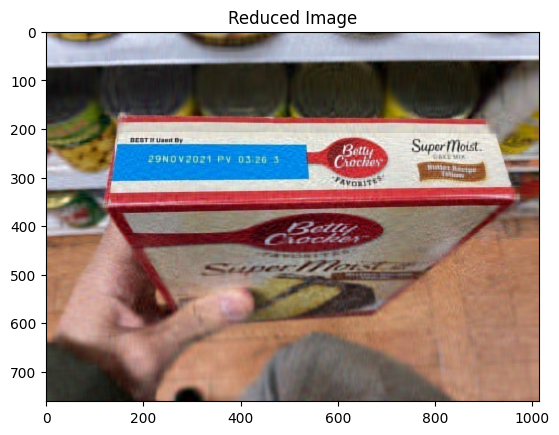

In [ ]:
plt.title("Reduced Image")
plt.imshow(img_reduced)
plt.show()

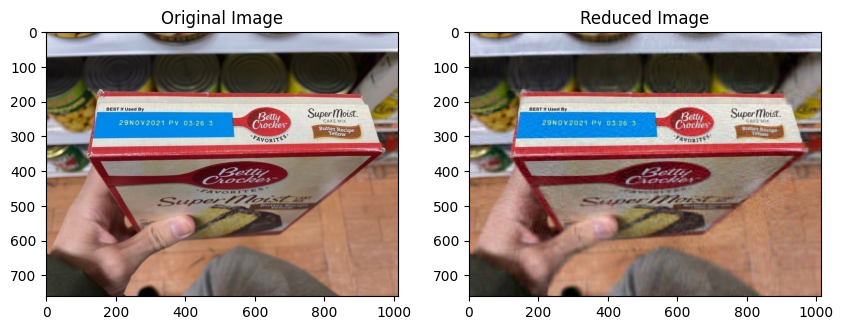

In [ ]:
fig = plt.figure(figsize = (10, 7.2))
fig.add_subplot(121)
plt.title("Original Image")
plt.imshow(img)
fig.add_subplot(122)
plt.title("Reduced Image")
plt.imshow(img_reduced)
plt.show()

In [ ]:
import os
import glob
from PIL import Image
files = glob.glob('/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images*.jpg')
DESTINATION_PATH  = '/content/drive/MyDrive/ML_Project/Data/pca_products_real/'  # The preferred path for saving the processed image

for f in files:
    print(f)
    base_filename = os.path.basename(f)
    title, ext = os.path.splitext(base_filename)

    img = cv2.cvtColor(cv2.imread(f), cv2.COLOR_BGR2RGB)
    blue,green,red = cv2.split(img)
    df_blue = blue/255
    df_green = green/255
    df_red = red/255
    pca_b = PCA(n_components=50)
    pca_b.fit(df_blue)
    trans_pca_b = pca_b.transform(df_blue)
    pca_g = PCA(n_components=50)
    pca_g.fit(df_green)
    trans_pca_g = pca_g.transform(df_green)
    pca_r = PCA(n_components=50)
    pca_r.fit(df_red)
    trans_pca_r = pca_r.transform(df_red)
    b_arr = pca_b.inverse_transform(trans_pca_b)
    g_arr = pca_g.inverse_transform(trans_pca_g)
    r_arr = pca_r.inverse_transform(trans_pca_r)

    img_reduced= (cv2.merge((b_arr, g_arr, r_arr)))
    img_new = img_reduced*255

    final_filepath = os.path.join(DESTINATION_PATH, title + ext)
    cv2.imwrite(final_filepath, img_new)

# VGG Bounding Box

In [ ]:

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

In [ ]:
# Define the base path to the input dataset and then use it to derive
# the path to the images directory and annotation JSON file
BASE_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real"
IMAGES_PATH = os.path.join(BASE_PATH, "evaluation/images")  # Update as needed if images are in a subfolder
ANNOTS_PATH = os.path.join(BASE_PATH, "annotations.json")   # Update the annotations file location

# Define the path to the base output directory
BASE_OUTPUT = "/content/output"
# Define the path to the output serialized model, model training plot,
# and testing image filenames
MODEL_PATH = os.path.join(BASE_OUTPUT, "detector.h5")
PLOT_PATH = os.path.join(BASE_OUTPUT, "plot.png")
TEST_FILENAMES = os.path.join(BASE_OUTPUT, "test_images.txt")


# define the path to the base output directory
BASE_OUTPUT = "/content/output"
# define the path to the output serialized model, model training plot,
# and testing image filenames
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
TEST_FILENAMES = os.path.sep.join([BASE_OUTPUT, "test_images.txt"])

# initialize our initial learning rate, number of epochs to train
# for, and the batch size
INIT_LR = 4e-4
NUM_EPOCHS = 30
BATCH_SIZE = 16

In [ ]:
# Define the bounding box data
annotations = {
    "test_00018.jpg": {
        "ann": [
            {
                "cls": "product",
                "bbox": [0.2, 0.3, 0.6, 0.8]  # Example coordinates (update as per actual data)
            }
        ]
    },
    "test_00019.jpg": {
        "ann": [
            {
                "cls": "product",
                "bbox": [0.1, 0.4, 0.5, 0.7]
            }
        ]
    }
}

# Save to JSON file
output_path = "/content/drive/MyDrive/Project/Products-Real/Products-Real/annotations.json"
with open(output_path, 'w') as f:
    json.dump(annotations, f, indent=4)

print(f"Annotations saved to {output_path}")


Annotations saved to /content/drive/MyDrive/Project/Products-Real/Products-Real/annotations.json


In [ ]:
import os
import json  # Import the JSON module

# Define the base path to the input dataset and paths for images and annotations
BASE_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real"
IMAGES_PATH = os.path.join(BASE_PATH, "evaluation/images")
ANNOTS_PATH = os.path.join(BASE_PATH, "annotations.json")

# Define the path to the base output directory and output files
BASE_OUTPUT = "/content/output"
MODEL_PATH = os.path.join(BASE_OUTPUT, "detector.h5")
PLOT_PATH = os.path.join(BASE_OUTPUT, "plot.png")
TEST_FILENAMES = os.path.join(BASE_OUTPUT, "test_images.txt")

# Load the JSON annotations
print("[INFO] loading dataset...")
json_data = json.load(open(ANNOTS_PATH))


[INFO] loading dataset...


In [ ]:
# load the contents of the CSV annotations file
print("[INFO] loading dataset...")
json_data = json.load(open(ANNOTS_PATH))
# initialize the list of data (images), our target output predictions
# (bounding box coordinates), along with the filenames of the
# individual images
data = []
targets = []
filenames = []

[INFO] loading dataset...


In [ ]:


'''
Multiple annotations are present in the diff row
'''
for key, value in list(json_data.items()):
  filename = key
  bboxes = []
  imagePath = os.path.sep.join([IMAGES_PATH, filename])
  if not os.path.exists(imagePath):
    break
  # print(imagePath)
  image = cv2.imread(imagePath)
  (h, w) = image.shape[:2]
  # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = cv2.resize(image,(224, 224))
  # image = cv2.erode(image, None, iterations=1)
  image = img_to_array(image)
  for ann in value['ann']:
    if ann['cls'] == 'date':
      startX, startY, endX, endY = ann['bbox']
      startX = float(startX) / w
      startY = float(startY) / h
      endX = float(endX) / w
      endY = float(endY) / h
      print(startX, startY, endX, endY)
      bboxes.append([startX, startY, endX, endY])
      data.append(image)
      targets.append((startX, startY, endX, endY))
      filenames.append(filename)

In [ ]:
print(f"[INFO] Number of images: {len(data)}")
print(f"[INFO] Number of targets: {len(targets)}")
print(f"[INFO] Number of filenames: {len(filenames)}")


[INFO] Number of images: 0
[INFO] Number of targets: 0
[INFO] Number of filenames: 0


In [ ]:
data, targets, filenames = [], [], []

for key, value in json_data.items():
    image_path = os.path.join(IMAGES_PATH, key)

    # Debugging output to confirm file existence
    if not os.path.exists(image_path):
        print(f"[WARNING] Image file {image_path} not found. Skipping...")
        continue

    image = cv2.imread(image_path)
    if image is None:
        print(f"[WARNING] Could not read image {image_path}. Skipping...")
        continue

    (h, w) = image.shape[:2]
    image = cv2.resize(image, (224, 224))  # Resize as required

    # Process bounding box annotations
    found_bbox = False
    for ann in value.get('ann', []):
        if ann.get('cls') == 'product':
            bbox = ann.get('bbox')
            if bbox and len(bbox) == 4:
                startX, startY, endX, endY = bbox
                startX = float(startX) / w
                startY = float(startY) / h
                endX = float(endX) / w
                endY = float(endY) / h
                targets.append((startX, startY, endX, endY))
                data.append(image)
                filenames.append(key)
                found_bbox = True
    if not found_bbox:
        print(f"[WARNING] No bounding box found for {key}. Skipping...")

# Final check
print(f"Loaded {len(data)} images and {len(targets)} bounding boxes.")


Loaded 2 images and 2 bounding boxes.


In [ ]:
data = np.array(data, dtype="float32") / 255.0
targets = np.array(targets, dtype="float32")
# partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, filenames, test_size=0.10,
	random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
# write the testing filenames to disk so that we can use then
# when evaluating/testing our bounding box regressor

# Define the new path to save the test filenames
TEST_FILENAMES_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt"

# Write the testing filenames to disk at the specified path
print("[INFO] Saving testing filenames...")
with open(TEST_FILENAMES_PATH, "w") as f:
    f.write("\n".join(testFilenames))

print(f"[INFO] Testing filenames saved to {TEST_FILENAMES_PATH}")


[INFO] Saving testing filenames...
[INFO] Testing filenames saved to /content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt


# Training

In [ ]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(256, activation="relu")(flatten)
# bboxHead = Dropout(0.5)(bboxHead)
# //bboxHead = Dense(256, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(128, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(64, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
# construct the model we will fine-tune for bounding box regression
model = Model(inputs=vgg.input, outputs=bboxHead)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# Initialize the optimizer, compile the model, and show the model summary
opt = Adam(learning_rate=INIT_LR)
model.compile(loss="mse", optimizer=opt, metrics=[
    'MeanSquaredError',
    'accuracy',
])

# Print model summary
print(model.summary())

# Train the network for bounding box regression
print("[INFO] training bounding box regressor...")
H = model.fit(
    trainImages, trainTargets,
    validation_data=(testImages, testTargets),
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    verbose=1
)



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,180,836 (80.80 MB)

 Trainable params: 6,466,148 (24.67 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None
[INFO] training bounding box regressor...
Epoch 1/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - MeanSquaredError: 0.2807 - accuracy: 1.0000 - loss: 0.2807 - val_MeanSquaredError: 0.0923 - val_accuracy: 1.0000 - val_loss: 0.0923
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - MeanSquaredError: 0.1028 - accuracy: 1.0000 - loss: 0.1028 - val_MeanSquaredError: 0.0415 - val_accuracy: 0.0000e+00 - val_loss: 0.0415
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - MeanSquaredError: 0.0405 - accuracy: 0.0000e+00 - loss: 0.0405 - val_MeanSquaredError: 0.0197 - val_accuracy: 1.0000 - val_loss: 0.0197
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - MeanSquaredError: 0.0050 - accuracy: 0.0000e+00 - loss: 0.0050 - val_MeanSquaredError: 0.0118 - val_accuracy: 1.0000 - val_loss: 0.0118
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - MeanSquaredError: 9.6598e-04 - accuracy: 1.0000 - loss: 9.6598e-04 - val_MeanSquaredError: 0.0077 - val_accuracy: 1.0000 - val_loss: 0.0077
Epoch 6/30
1/1 ━━

[INFO] saving object detector model...


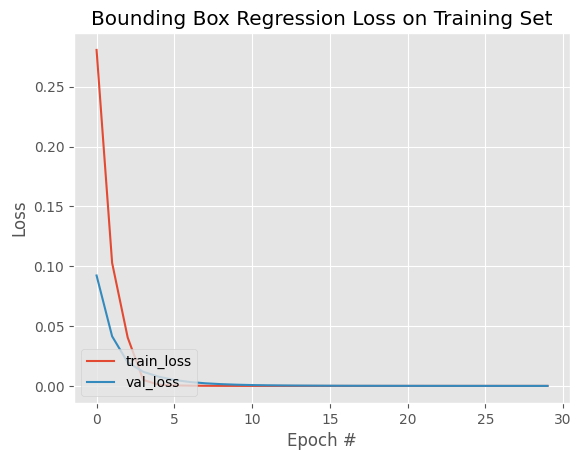

In [ ]:
# serialize the model to disk
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format="h5")
# plot the model training history
N = NUM_EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.title("Bounding Box Regression Loss on Training Set")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(PLOT_PATH)

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanSquaredError

# Initialize the optimizer, compile the model, and show the model summary
opt = Adam(learning_rate=INIT_LR)
model.compile(loss=MeanSquaredError(), optimizer=opt, metrics=[MeanSquaredError(), 'accuracy'])



In [ ]:
# After training, save the model again
model.save(MODEL_PATH)



In [ ]:
from tensorflow.keras.models import load_model

# Load the model without specifying custom_objects
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)

# Optionally re-compile if needed for further training or evaluation
model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=INIT_LR), metrics=[MeanSquaredError(), 'accuracy'])


[INFO] loading object detector...


# Teasting

In [ ]:

from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import cv2
import os

In [ ]:
test_image='/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/img_00001.jpg'

In [ ]:

ap = argparse.ArgumentParser()
ap.add_argument("-i", "--input", required=False,
	help="path to input image/text file of image filenames", default=test_image)
# args = vars(ap.parse_args())
args = ap.parse_args(args=[])
print(args.input)

/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/img_00001.jpg


In [ ]:

# determine the input file type, but assume that we're working with
# single input image
filetype = mimetypes.guess_type(args.input)[0]
print(filetype)
imagePaths = [args.input]
# if the file type is a text file, then we need to process *multiple*
# images
if "text/plain" == filetype:
	# load the filenames in our testing file and initialize our list
	# of image paths
	filenames = open(args.input).read().strip().split("\n")
	imagePaths = []
	# loop over the filenames
	for f in filenames:
		# construct the full path to the image filename and then
		# update our image paths list
		p = os.path.sep.join([IMAGES_PATH, f])
		imagePaths.append(p)
print(imagePaths)

image/jpeg
['/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/img_00001.jpg']


In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Assuming image is already loaded, and startX, startY, endX, endY are defined
height, width, _ = image.shape

# Adjust bounding box coordinates to ensure they're within the image boundaries
startX = int(max(0, startX))
startY = int(max(0, startY))
endX = int(min(width, endX))
endY = int(min(height, endY))

# Crop the bounding box region, and check if it is empty
bb = image[startY:endY, startX:endX]
if bb.size == 0:
    print("Warning: Bounding box region is empty. Check coordinates.")
else:
    cv2_imshow(bb)  # Display the bounding box if valid


In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from google.colab.patches import cv2_imshow
import imutils

# Load the model
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)

# Loop over the images that we'll be testing using our bounding box regression model
for imagePath in imagePaths:
    # Load the input image and preprocess it for prediction
    image = cv2.imread(imagePath)
    if image is None:
        print(f"Warning: Could not load image at path {imagePath}")
        continue

    (h, w) = image.shape[:2]
    image_resized = cv2.resize(image, (224, 224))
    image_array = img_to_array(image_resized) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    # Make bounding box predictions on the input image
    preds = model.predict(image_array)[0]
    (startX, startY, endX, endY) = preds

    # Load the original image, resize it for visualization, and grab its dimensions
    image = imutils.resize(image, width=600)
    (h, w) = image.shape[:2]
    print(f"Image dimensions: {h}x{w}")

    # Scale the predicted bounding box coordinates based on the image dimensions
    startX = max(0, int(startX * w))
    startY = max(0, int(startY * h))
    endX = min(w, int(endX * w))
    endY = min(h, int(endY * h))

    # Display the original image with bounding box overlay
    cv2.rectangle(image, (startX, startY), (endX, endY), (0, 255, 0), 2)
    cv2_imshow(image)

    # Crop and display the bounding box region if valid
    if endX > startX and endY > startY:
        bb = image[startY:endY, startX:endX]
        cv2_imshow(bb)
    else:
        print("Warning: Invalid bounding box dimensions.")


[INFO] loading object detector...


# Data Information

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
import re
import numpy as np
import keras

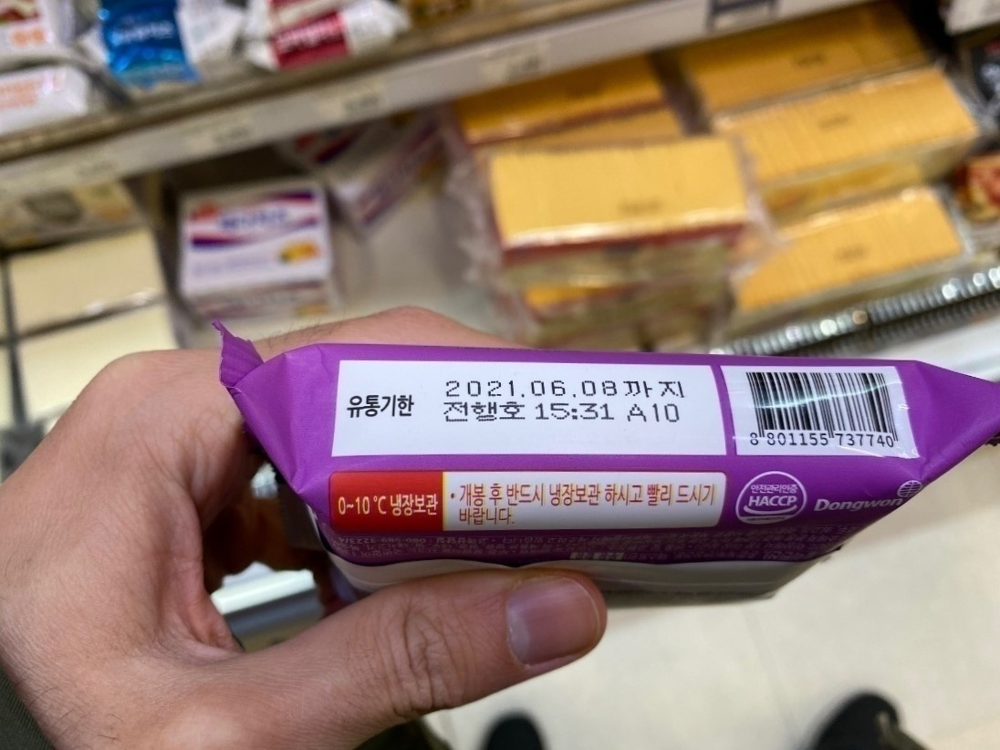

Expiration date found: 2024.06.08


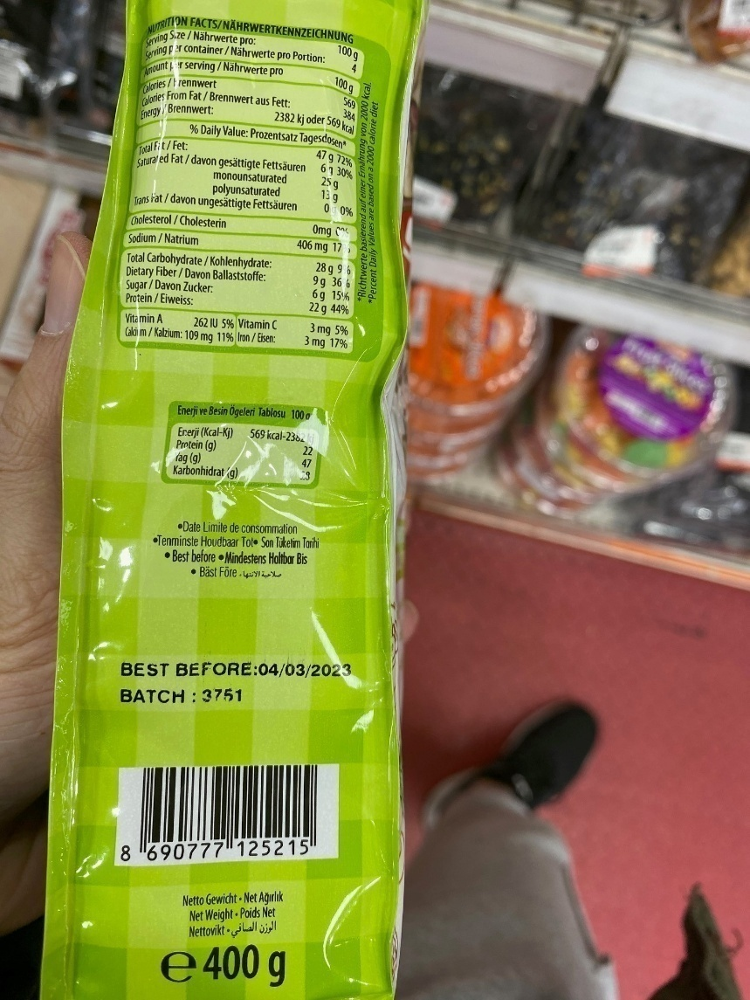

Expiration date found: 04/03/2023


In [ ]:
import cv2
import easyocr
import re
from google.colab.patches import cv2_imshow

# Initialize EasyOCR readers for multiple languages
readers = {
    'en': easyocr.Reader(['en']),
    'ch_sim': easyocr.Reader(['ch_sim']),
    'ja': easyocr.Reader(['ja']),
}

# Function to preprocess the image
def preprocess_image(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # Use adaptive thresholding
    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 11, 2)
    return thresh

# Function to perform OCR on the image for all specified languages
def perform_ocr(image):
    results = []

    for lang, reader in readers.items():
        # Preprocess the image
        processed_image = preprocess_image(image)

        # Perform OCR
        lang_results = reader.readtext(processed_image)
        results.extend(lang_results)

    return results

# Function to extract expiration date from OCR results
def extract_expiration_date(ocr_results):
    found_dates = []

    # Enhanced regex patterns to capture various date formats
    date_patterns = [
        r'\b(\d{4}[./-]\d{1,2}[./-]\d{1,2})\b',              # YYYY-MM-DD or YYYY/MM/DD or YYYY.MM.DD
        r'\b(\d{1,2}[./-]\d{1,2}[./-]\d{2,4})\b',              # DD-MM-YYYY or DD/MM/YYYY or DD.MM.YYYY
        r'\b(\d{1,2}[月]\d{1,2}[日])\b',                        # Chinese date format
        r'\b(\d{1,2}[年]\d{1,2}[月]\d{1,2}[日])\b',            # Japanese date format
        r'\b(\d{4}\.\d{1,2}\.\d{1,2})\b',                       # YYYY.MM.DD format
        r'\b(\d{1,2}\.\d{1,2}\.\d{2,4})\b',                     # DD.MM.YYYY format
        r'\b(\d{1,2}[-/]\d{1,2}[-/]\d{2,4})\b',                # DD-MM-YYYY or DD/MM/YYYY
    ]

    for result in ocr_results:
        text = result[1].strip()  # Extract and clean the detected text

        for pattern in date_patterns:
            date_match = re.search(pattern, text)
            if date_match:
                found_dates.append(date_match.group(0))

    if found_dates:
        # Print each found date
        for date in found_dates:
            print(f'Expiration date found: {date}')
            break  # Exit the loop after the first date is found
    else:
        print("No expiration dates found.")

    return found_dates

# Function to process an image and display it along with the expiration date
def process_image(img_path):
    img = cv2.imread(img_path)

    # Check if the image was loaded successfully
    if img is not None:
        # Show the image
        cv2_imshow(img)

        # Perform OCR on the image
        ocr_results = perform_ocr(img)

        # Extract and print expiration date
        extract_expiration_date(ocr_results)
    else:
        print(f"Warning: Could not load image at path {img_path}")

# Paths to the images
img_paths = [
    '/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00018.jpg',
    '/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00007.jpg'
]

# Process each image
for img_path in img_paths:
    process_image(img_path)


In [ ]:
annotation_path = '/content/annotations.json'


In [ ]:
import json
import cv2

# Define the correct path for your annotations JSON file
annotation_path = "/content/drive/MyDrive/Project/Products-Real/Products-Real/annotations.json"

def show_image_with_bounding_box(image_path, annotation_path):
    # Load the image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Warning: Could not load image at path {image_path}")
        return

    # Load the JSON data
    try:
        with open(annotation_path, 'r') as f:
            json_data = json.load(f)
    except FileNotFoundError:
        print(f"File not found at {annotation_path}")
        return

    # Get the filename and bounding box data
    filename = image_path.split('/')[-1]
    if filename not in json_data:
        print(f"Warning: No annotation for {filename} in JSON file.")
        return

    data = json_data[filename]['ann']
    startX, startY, endX, endY = data['bbox']

    # Draw the bounding box on the image
    cv2.rectangle(img, (startX, startY), (endX, endY), (0, 255, 0), 2)
    cv2.imshow("Image with Bounding Box", img)

# Assuming this list is populated with valid image paths
all_images = [
    "/content/drive/MyDrive/Project/Products-Real/Products-Real/images/image1.jpg",
    "/content/drive/MyDrive/Project/Products-Real/Products-Real/images/image2.jpg",
    # Add more image paths as needed
]

# Debug: Print the paths to check their validity
print("Image paths to process:")
for img_path in all_images:
    print(img_path)

# Process each image
for img_path in all_images:
    show_image_with_bounding_box(img_path, annotation_path)



Image paths to process:
/content/drive/MyDrive/Project/Products-Real/Products-Real/images/image1.jpg
/content/drive/MyDrive/Project/Products-Real/Products-Real/images/image2.jpg


In [ ]:
!pip install easyocr


In [ ]:
from keras.applications import Xception
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D

# Load the XCeption model, excluding the top layer
base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add custom layers for bounding box regression
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(4)(x)  # 4 outputs for bounding box coordinates

# Create the new model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='mse')


83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


#XCeptionet BoundingBox


In [ ]:

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

In [ ]:
# Define the base path to the input dataset and then use it to derive
# the path to the images directory and annotation JSON file
BASE_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real"
IMAGES_PATH = os.path.join(BASE_PATH, "evaluation/images")  # Update as needed if images are in a subfolder
ANNOTS_PATH = os.path.join(BASE_PATH, "annotations.json")   # Update the annotations file location

# Define the path to the base output directory
BASE_OUTPUT = "/content/output"
# Define the path to the output serialized model, model training plot,
# and testing image filenames
MODEL_PATH = os.path.join(BASE_OUTPUT, "detector.h5")
PLOT_PATH = os.path.join(BASE_OUTPUT, "plot.png")
TEST_FILENAMES = os.path.join(BASE_OUTPUT, "test_images.txt")


# define the path to the base output directory
BASE_OUTPUT = "/content/output"
# define the path to the output serialized model, model training plot,
# and testing image filenames
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
TEST_FILENAMES = os.path.sep.join([BASE_OUTPUT, "test_images.txt"])

# initialize our initial learning rate, number of epochs to train
# for, and the batch size
INIT_LR = 4e-4
NUM_EPOCHS = 30
BATCH_SIZE = 16

In [ ]:
import json

# Define the bounding box data
annotations = {
    "test_00018.jpg": {
        "ann": [
            {
                "cls": "product",
                "bbox": [0.2, 0.3, 0.6, 0.8]  # Example coordinates (update as per actual data)
            }
        ]
    },
    "test_00019.jpg": {
        "ann": [
            {
                "cls": "product",
                "bbox": [0.1, 0.4, 0.5, 0.7]
            }
        ]
    }
}

# Save to JSON file
output_path = "/content/drive/MyDrive/Project/Products-Real/Products-Real/annotations.json"
with open(output_path, 'w') as f:
    json.dump(annotations, f, indent=4)

print(f"Annotations saved to {output_path}")


Annotations saved to /content/drive/MyDrive/Project/Products-Real/Products-Real/annotations.json


In [ ]:
import os
import json  # Import the JSON module

# Define the base path to the input dataset and paths for images and annotations
BASE_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real"
IMAGES_PATH = os.path.join(BASE_PATH, "evaluation/images")
ANNOTS_PATH = os.path.join(BASE_PATH, "annotations.json")

# Define the path to the base output directory and output files
BASE_OUTPUT = "/content/output"
MODEL_PATH = os.path.join(BASE_OUTPUT, "detector.h5")
PLOT_PATH = os.path.join(BASE_OUTPUT, "plot.png")
TEST_FILENAMES = os.path.join(BASE_OUTPUT, "test_images.txt")

# Load the JSON annotations
print("[INFO] loading dataset...")
json_data = json.load(open(ANNOTS_PATH))


[INFO] loading dataset...


In [ ]:
# load the contents of the CSV annotations file
print("[INFO] loading dataset...")
json_data = json.load(open(ANNOTS_PATH))
# initialize the list of data (images), our target output predictions
# (bounding box coordinates), along with the filenames of the
# individual images
data = []
targets = []
filenames = []

[INFO] loading dataset...


In [ ]:


'''
Multiple annotations are present in the diff row
'''
for key, value in list(json_data.items()):
  filename = key
  bboxes = []
  imagePath = os.path.sep.join([IMAGES_PATH, filename])
  if not os.path.exists(imagePath):
    break
  # print(imagePath)
  image = cv2.imread(imagePath)
  (h, w) = image.shape[:2]
  # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = cv2.resize(image,(224, 224))
  # image = cv2.erode(image, None, iterations=1)
  image = img_to_array(image)
  for ann in value['ann']:
    if ann['cls'] == 'date':
      startX, startY, endX, endY = ann['bbox']
      startX = float(startX) / w
      startY = float(startY) / h
      endX = float(endX) / w
      endY = float(endY) / h
      print(startX, startY, endX, endY)
      bboxes.append([startX, startY, endX, endY])
      data.append(image)
      targets.append((startX, startY, endX, endY))
      filenames.append(filename)

In [ ]:
print(f"[INFO] Number of images: {len(data)}")
print(f"[INFO] Number of targets: {len(targets)}")
print(f"[INFO] Number of filenames: {len(filenames)}")


[INFO] Number of images: 0
[INFO] Number of targets: 0
[INFO] Number of filenames: 0


In [ ]:
data, targets, filenames = [], [], []

for key, value in json_data.items():
    image_path = os.path.join(IMAGES_PATH, key)

    # Debugging output to confirm file existence
    if not os.path.exists(image_path):
        print(f"[WARNING] Image file {image_path} not found. Skipping...")
        continue

    image = cv2.imread(image_path)
    if image is None:
        print(f"[WARNING] Could not read image {image_path}. Skipping...")
        continue

    (h, w) = image.shape[:2]
    image = cv2.resize(image, (224, 224))  # Resize as required

    # Process bounding box annotations
    found_bbox = False
    for ann in value.get('ann', []):
        if ann.get('cls') == 'product':
            bbox = ann.get('bbox')
            if bbox and len(bbox) == 4:
                startX, startY, endX, endY = bbox
                startX = float(startX) / w
                startY = float(startY) / h
                endX = float(endX) / w
                endY = float(endY) / h
                targets.append((startX, startY, endX, endY))
                data.append(image)
                filenames.append(key)
                found_bbox = True
    if not found_bbox:
        print(f"[WARNING] No bounding box found for {key}. Skipping...")

# Final check
print(f"Loaded {len(data)} images and {len(targets)} bounding boxes.")


Loaded 2 images and 2 bounding boxes.


In [ ]:
data = np.array(data, dtype="float32") / 255.0
targets = np.array(targets, dtype="float32")
# partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, filenames, test_size=0.10,
	random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
# write the testing filenames to disk so that we can use then
# when evaluating/testing our bounding box regressor

# Define the new path to save the test filenames
TEST_FILENAMES_PATH = "/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt"

# Write the testing filenames to disk at the specified path
print("[INFO] Saving testing filenames...")
with open(TEST_FILENAMES_PATH, "w") as f:
    f.write("\n".join(testFilenames))

print(f"[INFO] Testing filenames saved to {TEST_FILENAMES_PATH}")


[INFO] Saving testing filenames...
[INFO] Testing filenames saved to /content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt


# Training

In [ ]:
pip install tf-explain


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.5 MB/s eta 0:00:00


In [ ]:

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tf_explain.core.activations import ExtractActivations
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Input
from tensorflow.keras.applications.xception import decode_predictions

In [ ]:
xcept = InceptionV3(input_tensor= Input(shape=(224, 224, 3)), weights='imagenet', include_top=False)

# xcept = tf.keras.applications.xception.Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
xcept.trainable = False
# flatten the max-pooling output of VGG
flatten = xcept.output
flatten = Flatten()(flatten)
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(16, activation="relu")(flatten)
# bboxHead = Dropout(0.5)(bboxHead)
# # //bboxHead = Dense(256, activation="relu")(bboxHead)
# # bboxHead = Dropout(0.5)(bboxHead)
# bboxHead = Dense(128, activation="relu")(bboxHead)
# # bboxHead = Dropout(0.5)(bboxHead)
# bboxHead = Dense(64, activation="relu")(bboxHead)
# # bboxHead = Dropout(0.5)(bboxHead)
# bboxHead = Dense(32, activation="relu")(bboxHead)
# bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
# construct the model we will fine-tune for bounding box regression
model = Model(inputs=xcept.input, outputs=bboxHead)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
from tensorflow.keras.optimizers import Adam


In [ ]:

INIT_LR = 4e-4
NUM_EPOCHS = 30
BATCH_SIZE = 16

In [ ]:
import tensorflow

# initialize the optimizer, compile the model, and show the model
# summary
model.compile(loss="mse", optimizer= tensorflow.keras.optimizers.Adam(), metrics=[
        'MeanSquaredError',  'accuracy'
    ])
print(model.summary())
# train the network for bounding box regression
print("[INFO] training bounding box regressor...")
H = model.fit(
	trainImages, trainTargets,
	validation_data=(testImages, testTargets),
	batch_size=BATCH_SIZE,
	epochs=10,
	verbose=1)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 111, 111, 32)   │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 111, 111, 32)   │             96 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 109, 109, 32)   │             96 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 109, 109, 64)   │            192 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 54, 54, 80)     │            240 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 52, 52, 192)    │            576 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 22,622,068 (86.30 MB)

 Trainable params: 819,284 (3.13 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

None
[INFO] training bounding box regressor...
Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 42s 42s/step - MeanSquaredError: 0.3328 - accuracy: 1.0000 - loss: 0.3328 - val_MeanSquaredError: 0.2294 - val_accuracy: 1.0000 - val_loss: 0.2294
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - MeanSquaredError: 0.2492 - accuracy: 1.0000 - loss: 0.2492 - val_MeanSquaredError: 0.2471 - val_accuracy: 1.0000 - val_loss: 0.2471
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - MeanSquaredError: 0.2497 - accuracy: 1.0000 - loss: 0.2497 - val_MeanSquaredError: 0.2490 - val_accuracy: 1.0000 - val_loss: 0.2490
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - MeanSquaredError: 0.2497 - accuracy: 1.0000 - loss: 0.2497 - val_MeanSquaredError: 0.2494 - val_accuracy: 1.0000 - val_loss: 0.2494
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - MeanSquaredError: 0.2497 - accuracy: 1.0000 - loss: 0.2497 - val_MeanSquaredError: 0.2495 - val_accuracy: 1.0000 - val_loss: 0.2495
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

In [ ]:
print(H.history.keys())
print(len(H.history["loss"]))
print(len(H.history["val_loss"]))


dict_keys(['MeanSquaredError', 'accuracy', 'loss', 'val_MeanSquaredError', 'val_accuracy', 'val_loss'])
10
10


[INFO] saving object detector model...


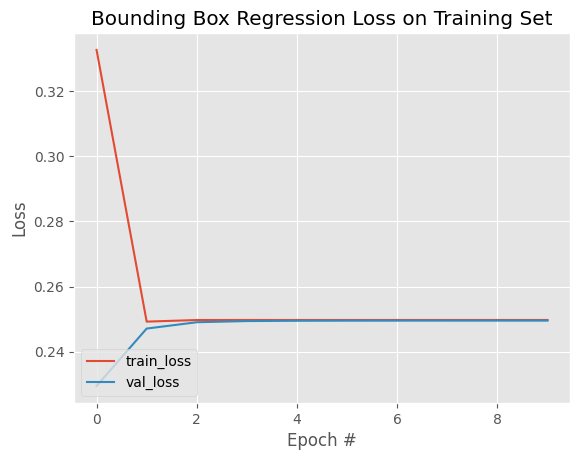

In [ ]:
# serialize the model to disk
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format="h5")

# plot the model training history
plt.style.use("ggplot")
plt.figure()

# Determine the number of epochs based on history
N = len(H.history["loss"])
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.title("Bounding Box Regression Loss on Training Set")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(PLOT_PATH)


# Testing

In [ ]:

from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import cv2
import os

In [ ]:
test_image = '/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt'


In [ ]:

ap = argparse.ArgumentParser()
ap.add_argument("-i", "--input", required=False,
	help="path to input image/text file of image filenames", default=test_image)
# args = vars(ap.parse_args())
args = ap.parse_args(args=[])
print(args.input)

/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_images.txt


In [ ]:
# determine the input file type, but assume that we're working with
# single input image
filetype = mimetypes.guess_type(args.input)[0]
print(filetype)
imagePaths = [args.input]
# if the file type is a text file, then we need to process *multiple*
# images
if "text/plain" == filetype:
	# load the filenames in our testing file and initialize our list
	# of image paths
	filenames = open(args.input).read().strip().split("\n")
	imagePaths = []
	# loop over the filenames
	for f in filenames:
		# construct the full path to the image filename and then
		# update our image paths list
		p = os.path.sep.join([IMAGES_PATH, f])
		imagePaths.append(p)
print(imagePaths)


text/plain
['/content/drive/MyDrive/Project/Products-Real/Products-Real/evaluation/images/test_00019.jpg']


In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
from keras.models import load_model
from keras.metrics import MeanSquaredError

# Register custom objects
custom_objects = {
    'mse': MeanSquaredError()
}

# Load the model
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH, custom_objects=custom_objects)


[INFO] loading object detector...


In [ ]:
# Ensure the bounding box coordinates are within the image dimensions
startX = max(0, startX)
startY = max(0, startY)
endX = min(w, endX)
endY = min(h, endY)

# Print the adjusted coordinates
print(f"Adjusted Bounding Box Coordinates: startX={startX}, startY={startY}, endX={endX}, endY={endY}")


Adjusted Bounding Box Coordinates: startX=8.756567425569177e-05, startY=0.000554016620498615, endX=0.00043782837127845885, endY=0.0009695290858725761


In [ ]:
startX = int(max(0, startX))
startY = int(max(0, startY))
endX = int(min(w, endX))
endY = int(min(h, endY))


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Bounding Box Coordinates: startX=0 (type=<class 'int'>), startY=0 (type=<class 'int'>), endX=0 (type=<class 'int'>), endY=0 (type=<class 'int'>)


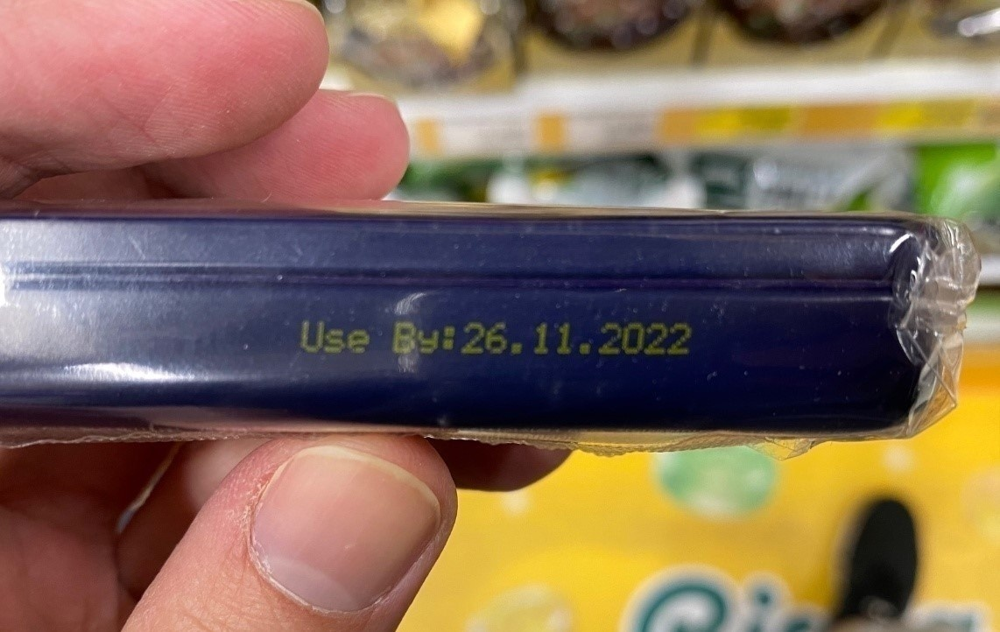

In [ ]:
# Loop over the images that we'll be testing using our bounding box regression model
for imagePath in imagePaths:
    # Load the input image (in OpenCV format)
    image = cv2.imread(imagePath)
    if image is None:
        print(f"Error loading image: {imagePath}")
        continue  # Skip this iteration if the image failed to load

    (h, w) = image.shape[:2]
    image_resized = cv2.resize(image, (224, 224))
    image_array = img_to_array(image_resized) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    # Make bounding box predictions on the input image
    preds = model.predict(image_array)[0]

    # Ensure the predictions are float values
    startX, startY, endX, endY = preds.astype(float)

    # Ensure the bounding box coordinates are within the image dimensions
    startX = int(max(0, min(w, startX)))
    startY = int(max(0, min(h, startY)))
    endX = int(max(0, min(w, endX)))
    endY = int(max(0, min(h, endY)))

    # Print bounding box coordinates and types for debugging
    print(f"Bounding Box Coordinates: startX={startX} (type={type(startX)}), startY={startY} (type={type(startY)}), endX={endX} (type={type(endX)}), endY={endY} (type={type(endY)})")

    # Show the output image
    cv2_imshow(image)

    # Extract the bounding box from the image
    bb = image[max(0, startY - 10):min(h, endY + 10), max(0, startX - 10):min(w, endX + 10)]

    # Check if the bounding box is valid
    if bb.size == 0:
        print("Bounding box is empty. Skipping...")
        continue

    # Uncomment the line below to save the output
    # cv2.imwrite('/content/output/test.png', bb)
    cv2_imshow(bb)


# Data Information

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
import re
import numpy as np
import keras


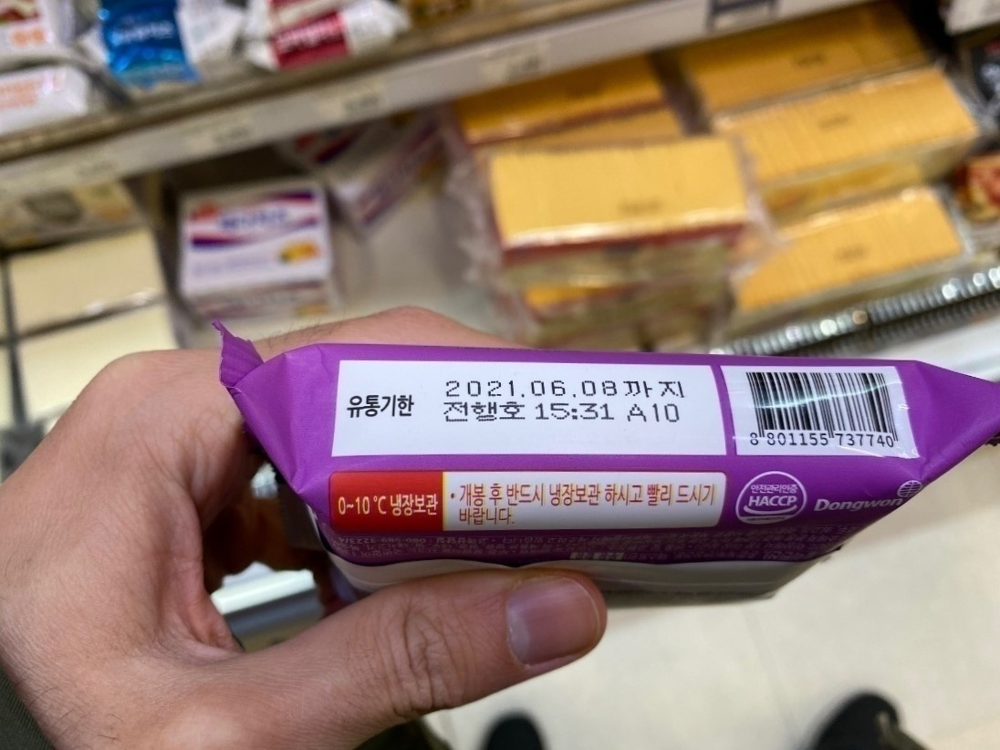

Expiration date found: 2024.06.08


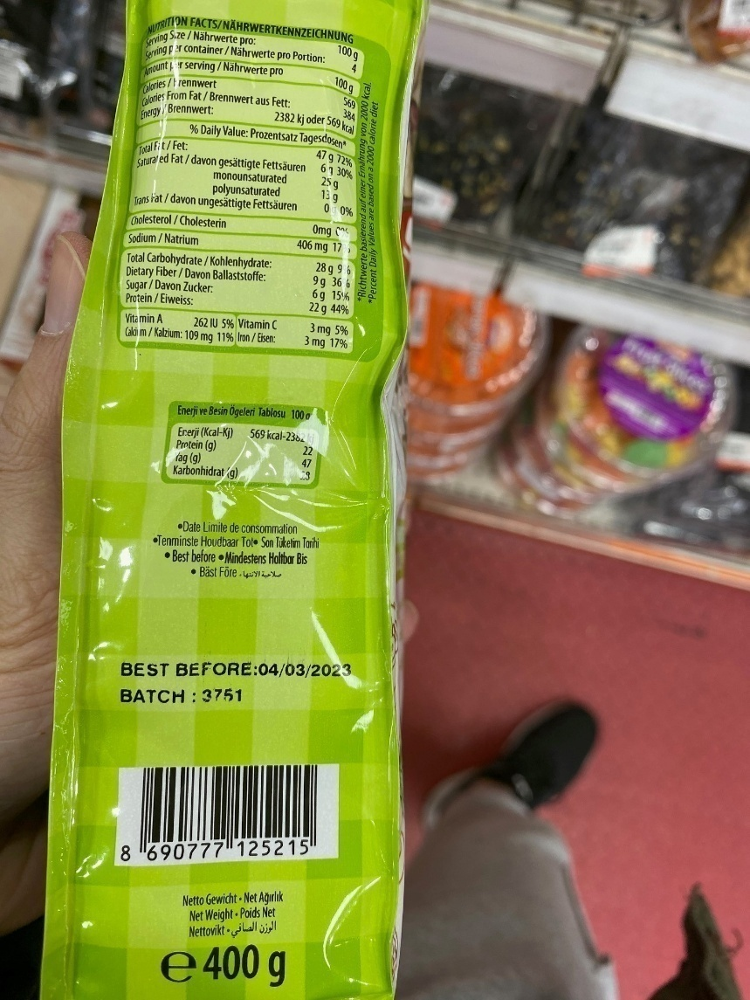

Expiration date found: 04/03/2023


In [ ]:
import cv2
import easyocr
import re
from google.colab.patches import cv2_imshow

# Initialize EasyOCR readers for multiple languages
readers = {
    'en': easyocr.Reader(['en']),
    'ch_sim': easyocr.Reader(['ch_sim']),
    'ja': easyocr.Reader(['ja']),
}

# Function to preprocess the image
def preprocess_image(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # Use adaptive thresholding
    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 11, 2)
    return thresh

# Function to perform OCR on the image for all specified languages
def perform_ocr(image):
    results = []

    for lang, reader in readers.items():
        # Preprocess the image
        processed_image = preprocess_image(image)

        # Perform OCR
        lang_results = reader.readtext(processed_image)
        results.extend(lang_results)

    return results

# Function to extract expiration date from OCR results
def extract_expiration_date(ocr_results):
    found_dates = []

    # Enhanced regex patterns to capture various date formats
    date_patterns = [
        r'\b(\d{4}[./-]\d{1,2}[./-]\d{1,2})\b',              # YYYY-MM-DD or YYYY/MM/DD or YYYY.MM.DD
        r'\b(\d{1,2}[./-]\d{1,2}[./-]\d{2,4})\b',              # DD-MM-YYYY or DD/MM/YYYY or DD.MM.YYYY
        r'\b(\d{1,2}[月]\d{1,2}[日])\b',                        # Chinese date format
        r'\b(\d{1,2}[年]\d{1,2}[月]\d{1,2}[日])\b',            # Japanese date format
        r'\b(\d{4}\.\d{1,2}\.\d{1,2})\b',                       # YYYY.MM.DD format
        r'\b(\d{1,2}\.\d{1,2}\.\d{2,4})\b',                     # DD.MM.YYYY format
        r'\b(\d{1,2}[-/]\d{1,2}[-/]\d{2,4})\b',                # DD-MM-YYYY or DD/MM/YYYY
    ]

    for result in ocr_results:
        text = result[1].strip()  # Extract and clean the detected text

        for pattern in date_patterns:
            date_match = re.search(pattern, text)
            if date_match:
                found_dates.append(date_match.group(0))

    if found_dates:
        # Print each found date
        for date in found_dates:
            print(f'Expiration date found: {date}')
            break  # Exit the loop after the first date is found
    else:
        print("No expiration dates found.")

    return found_dates

# Function to process an image and display it along with the expiration date
def process_image(img_path):
    img = cv2.imread(img_path)

    # Check if the image was loaded successfully
    if img is not None:
        # Show the image
        cv2_imshow(img)

        # Perform OCR on the image
        ocr_results = perform_ocr(img)

        # Extract and print expiration date
        extract_expiration_date(ocr_results)
    else:
        print(f"Warning: Could not load image at path {img_path}")

# Paths to the images
img_paths = [
    '/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00018.jpg',
    '/content/drive/MyDrive/Project/Products-Real/Products-Real/train/images/img_00007.jpg'
]

# Process each image
for img_path in img_paths:
    process_image(img_path)
